In [2]:
import pandas as pd
import warnings
warnings.filterwarnings('ignore')

In [6]:
df = pd.read_excel('TFIDF_result.xlsx')
df = df.drop(columns=['Unnamed: 0'])
df.head()

,Unnamed: 0,label,tweet,tweet_list,TF_dict,TF-IDF_dict,TF_IDF_Vec,tweet_join,TF_UNIGRAM,IDF_UNIGRAM,TFIDF_UNIGRAM,TF_BIGRAM,IDF_BIGRAM,TFIDF_BIGRAM,TWEET_BIGRAM,TF_trigram,IDF_trigram,TFIDF_trigram,TWEET_TRIGRAM
0,0,1.536196e+17,"['lomba', 'poster', 'ilmiah', 'energi', 'baru'...","['lomba', 'poster', 'ilmiah', 'energi', 'baru'...","{'lomba': 0.08333333333333333, 'poster': 0.083...","{'lomba': 0.5139559095960712, 'poster': 0.6556...","[0.0, 0.06746782617927817, 0.08177705360907206...",lomba poster ilmiah energi baru deadline janua...,"[0.3333333333333333, 0.3333333333333333, 0.333...","[1.9813003239470035, 1.8095319872301059, 7.171...","[0.6604334413156678, 0.603177329076702, 2.3906...",[1.0],[2.0053219554698467],[2.0053219554698467],['energi baru'],[],[],[],[]
1,1,1.538575e+17,"['elaahhh', 'ngomong', 'energi', 'baru', 'tv',...","['elaahhh', 'ngomong', 'energi', 'baru', 'tv',...","{'elaahhh': 0.16666666666666666, 'ngomong': 0....","{'elaahhh': 1.8187338405860176, 'ngomong': 1.2...","[0.0, 0.13493565235855634, 0.16355410721814412...",elaahhh ngomong energi baru tv biruu,"[0.3333333333333333, 0.3333333333333333, 0.333...","[1.9813003239470035, 1.8095319872301059, 7.180...","[0.6604334413156678, 0.603177329076702, 2.3935...",[1.0],[2.0053219554698467],[2.0053219554698467],['energi baru'],[],[],[],[]
2,2,1.543614e+17,"['daerah', 'pencil', 'membutuhkam', 'listrik',...","['daerah', 'pencil', 'membutuhkam', 'listrik',...","{'daerah': 0.14285714285714285, 'pencil': 0.14...","{'daerah': 0.6565916130524876, 'pencil': 0.873...","[0.0, 0.11565913059304829, 0.14018923475840925...",daerah pencil membutuhkam listrik manfaat ener...,"[0.16666666666666666, 0.16666666666666666, 0.1...","[1.9813003239470035, 5.59704504199377, 1.80953...","[0.3302167206578339, 0.932840840332295, 0.3015...","[0.3333333333333333, 0.3333333333333333, 0.333...","[7.594914929979795, 2.0053219554698467, 5.1262...","[2.531638309993265, 0.6684406518232822, 1.7087...","['daerah pencil', 'energi baru', 'manfaat ener...",[1.0],[5.356335166961661],[5.356335166961661],['manfaat energi baru']
3,3,1.563972e+17,"['tarik', 'materi', 'energi', 'baru', 'baek', ...","['tarik', 'materi', 'energi', 'baru', 'baek', ...","{'tarik': 0.1111111111111111, 'materi': 0.1111...","{'tarik': 0.5356770179376007, 'materi': 0.7584...","[0.0, 0.0899571015723709, 0.10903607147876274,...",tarik materi energi baru baek ganti nama propa...,"[0.16666666666666666, 0.16666666666666666, 0.1...","[1.9813003239470035, 1.8095319872301059, 5.779...","[0.3302167206578339, 0.301588664538351, 0.9631...",[1.0],[2.0053219554698467],[2.0053219554698467],['energi baru'],[],[],[],[]
4,4,1.569363e+17,"['aneh', 'inget', 'jatropa', 'alias', 'minyak'...","['aneh', 'inget', 'jatropa', 'alias', 'minyak'...","{'aneh': 0.07692307692307693, 'inget': 0.07692...","{'aneh': 0.5830921948723771, 'inget': 0.581730...","[0.05948689744429845, 0.06227799339625678, 0.0...",aneh inget jatropa alias minyak jarak bbrp jat...,"[0.25, 0.25, 0.25, 0.25]","[1.9813003239470035, 1.7725201339900192, 1.809...","[0.4953250809867509, 0.4431300334975048, 0.452...","[0.5, 0.5]","[4.168049801569062, 2.0053219554698467]","[2.084024900784531, 1.0026609777349234]","['baru ebt', 'energi baru']",[1.0],[4.194384437305343],[4.194384437305343],['energi baru ebt']


In [7]:
df.shape

(109705, 19)

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 109705 entries, 0 to 109704
Data columns (total 19 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Unnamed: 0     109705 non-null  int64  
 1   label          109705 non-null  float64
 2   tweet          109705 non-null  object 
 3   tweet_list     109705 non-null  object 
 4   TF_dict        109705 non-null  object 
 5   TF-IDF_dict    109705 non-null  object 
 6   TF_IDF_Vec     109705 non-null  object 
 7   tweet_join     109404 non-null  object 
 8   TF_UNIGRAM     109705 non-null  object 
 9   IDF_UNIGRAM    109705 non-null  object 
 10  TFIDF_UNIGRAM  109705 non-null  object 
 11  TF_BIGRAM      109705 non-null  object 
 12  IDF_BIGRAM     109705 non-null  object 
 13  TFIDF_BIGRAM   109705 non-null  object 
 14  TWEET_BIGRAM   109705 non-null  object 
 15  TF_trigram     109705 non-null  object 
 16  IDF_trigram    109705 non-null  object 
 17  TFIDF_trigram  109705 non-nul

In [9]:
df_new = df[df['tweet_join'].notnull()]
df_new['tweet_join'] = df_new['tweet_join'].astype(str)

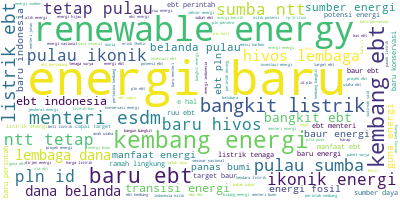

In [10]:
# Import the wordcloud library
from wordcloud import WordCloud
# Join the different processed titles together.
long_string = ','.join(list(df_new['tweet_join'].values))
# Create a WordCloud object
wordcloud = WordCloud(background_color="white", max_words=5000, contour_width=3, contour_color='steelblue')
# Generate a word cloud
wordcloud.generate(long_string)
# Visualize the word cloud
wordcloud.to_image()

In [11]:
text = df_new['tweet_join']
text_list =  [i.split() for i in text]
#text_list =  [i for i in text]
print(len(text_list))
print(text_list)

109404
[['lomba', 'poster', 'ilmiah', 'energi', 'baru', 'deadline', 'januari', 'untuk', 'siswa', 'sma', 'smk', 'derajat'], ['elaahhh', 'ngomong', 'energi', 'baru', 'tv', 'biruu'], ['daerah', 'pencil', 'membutuhkam', 'listrik', 'manfaat', 'energi', 'baru'], ['tarik', 'materi', 'energi', 'baru', 'baek', 'ganti', 'nama', 'propasif', 'ajah'], ['aneh', 'inget', 'jatropa', 'alias', 'minyak', 'jarak', 'bbrp', 'jatropa', 'digembar', 'gembor', 'energi', 'baru', 'ebt'], ['eco', 'power', 'booster', 'karya', 'mahasiswa', 'universitas', 'nasional', 'kembang', 'energi', 'baru'], ['mahasiswa', 'tawur', 'energi', 'baru', 'eco', 'power', 'booster', 'karya', 'mahasiswa', 'universitas', 'nasional'], ['misi', 'jalan', 'usaha', 'minyak', 'gas', 'energi', 'baru', 'integrasi', 'dasar', 'prinsip', 'prinsip', 'komersial', 'kuat'], ['seru', 'adik', 'sd', 'pangudi', 'luhur', 'solo', 'praktek', 'energi', 'baru', 'bsama', 'sharp'], ['usaha', 'nuklir', 'salah', 'jenis', 'energi', 'baru', 'layak', 'kenal'], ['usaha'

In [12]:
#https://sites.unpad.ac.id/widodo/2021/03/09/nlp-dengan-python/
df_new.head(5)

,Unnamed: 0,label,tweet,tweet_list,TF_dict,TF-IDF_dict,TF_IDF_Vec,tweet_join,TF_UNIGRAM,IDF_UNIGRAM,TFIDF_UNIGRAM,TF_BIGRAM,IDF_BIGRAM,TFIDF_BIGRAM,TWEET_BIGRAM,TF_trigram,IDF_trigram,TFIDF_trigram,TWEET_TRIGRAM
0,0,1.536196e+17,"['lomba', 'poster', 'ilmiah', 'energi', 'baru'...","['lomba', 'poster', 'ilmiah', 'energi', 'baru'...","{'lomba': 0.08333333333333333, 'poster': 0.083...","{'lomba': 0.5139559095960712, 'poster': 0.6556...","[0.0, 0.06746782617927817, 0.08177705360907206...",lomba poster ilmiah energi baru deadline janua...,"[0.3333333333333333, 0.3333333333333333, 0.333...","[1.9813003239470035, 1.8095319872301059, 7.171...","[0.6604334413156678, 0.603177329076702, 2.3906...",[1.0],[2.0053219554698467],[2.0053219554698467],['energi baru'],[],[],[],[]
1,1,1.538575e+17,"['elaahhh', 'ngomong', 'energi', 'baru', 'tv',...","['elaahhh', 'ngomong', 'energi', 'baru', 'tv',...","{'elaahhh': 0.16666666666666666, 'ngomong': 0....","{'elaahhh': 1.8187338405860176, 'ngomong': 1.2...","[0.0, 0.13493565235855634, 0.16355410721814412...",elaahhh ngomong energi baru tv biruu,"[0.3333333333333333, 0.3333333333333333, 0.333...","[1.9813003239470035, 1.8095319872301059, 7.180...","[0.6604334413156678, 0.603177329076702, 2.3935...",[1.0],[2.0053219554698467],[2.0053219554698467],['energi baru'],[],[],[],[]
2,2,1.543614e+17,"['daerah', 'pencil', 'membutuhkam', 'listrik',...","['daerah', 'pencil', 'membutuhkam', 'listrik',...","{'daerah': 0.14285714285714285, 'pencil': 0.14...","{'daerah': 0.6565916130524876, 'pencil': 0.873...","[0.0, 0.11565913059304829, 0.14018923475840925...",daerah pencil membutuhkam listrik manfaat ener...,"[0.16666666666666666, 0.16666666666666666, 0.1...","[1.9813003239470035, 5.59704504199377, 1.80953...","[0.3302167206578339, 0.932840840332295, 0.3015...","[0.3333333333333333, 0.3333333333333333, 0.333...","[7.594914929979795, 2.0053219554698467, 5.1262...","[2.531638309993265, 0.6684406518232822, 1.7087...","['daerah pencil', 'energi baru', 'manfaat ener...",[1.0],[5.356335166961661],[5.356335166961661],['manfaat energi baru']
3,3,1.563972e+17,"['tarik', 'materi', 'energi', 'baru', 'baek', ...","['tarik', 'materi', 'energi', 'baru', 'baek', ...","{'tarik': 0.1111111111111111, 'materi': 0.1111...","{'tarik': 0.5356770179376007, 'materi': 0.7584...","[0.0, 0.0899571015723709, 0.10903607147876274,...",tarik materi energi baru baek ganti nama propa...,"[0.16666666666666666, 0.16666666666666666, 0.1...","[1.9813003239470035, 1.8095319872301059, 5.779...","[0.3302167206578339, 0.301588664538351, 0.9631...",[1.0],[2.0053219554698467],[2.0053219554698467],['energi baru'],[],[],[],[]
4,4,1.569363e+17,"['aneh', 'inget', 'jatropa', 'alias', 'minyak'...","['aneh', 'inget', 'jatropa', 'alias', 'minyak'...","{'aneh': 0.07692307692307693, 'inget': 0.07692...","{'aneh': 0.5830921948723771, 'inget': 0.581730...","[0.05948689744429845, 0.06227799339625678, 0.0...",aneh inget jatropa alias minyak jarak bbrp jat...,"[0.25, 0.25, 0.25, 0.25]","[1.9813003239470035, 1.7725201339900192, 1.809...","[0.4953250809867509, 0.4431300334975048, 0.452...","[0.5, 0.5]","[4.168049801569062, 2.0053219554698467]","[2.084024900784531, 1.0026609777349234]","['baru ebt', 'energi baru']",[1.0],[4.194384437305343],[4.194384437305343],['energi baru ebt']


In [202]:
import gensim
#Create Bigram & Trigram Models 
from gensim.models import Phrases
# Add bigrams and trigrams to docs,minimum count 10 means only that appear 10 times or more.
bigram = Phrases(text_list, min_count=10)
trigram = Phrases(bigram[text_list])
for idx in range(len(text_list)):
    for token in bigram[text_list[idx]]:
        if '_' in token:
            # Token is a bigram, add to document.
            text_list[idx].append(token)
    for token in trigram[text_list[idx]]:
        if '_' in token:
            # Token is a bigram, add to document.
            text_list[idx].append(token)

In [204]:
from gensim import corpora, models
# Create a dictionary representation of the documents.
dictionary = corpora.Dictionary(text_list)
dictionary.filter_extremes(no_below=5, no_above=0.2) 
#no_below (int, optional) – Keep tokens which are contained in at least no_below documents.
#no_above (float, optional) – Keep tokens which are contained in no more than no_above documents (fraction of total corpus size, not an absolute number).
print(dictionary)

Dictionary<16355 unique tokens: ['deadline', 'derajat', 'ilmiah', 'januari', 'lomba']...>


In [205]:
#https://radimrehurek.com/gensim/tut1.html 
#build corpus
# Converting list of documents (corpus) into Document Term Matrix using dictionary prepared above.
doc_term_matrix = [dictionary.doc2bow(doc) for doc in text_list]
#The function doc2bow converts document (a list of words) into the bag-of-words format
'''The function doc2bow() simply counts the number of occurrences of each distinct word, 
converts the word to its integer word id and returns the result as a sparse vector. 
The sparse vector [(0, 1), (1, 1)] therefore reads: in the document “Human computer interaction”, 
the words computer (id 0) and human (id 1) appear once; 
the other ten dictionary words appear (implicitly) zero times.'''
print(len(doc_term_matrix))
print(doc_term_matrix[100])
tfidf = models.TfidfModel(doc_term_matrix) #build TF-IDF model
corpus_tfidf = tfidf[doc_term_matrix]

109437
[(35, 1), (188, 1)]


In [221]:
doc_term_matrix

[[(0, 1),
  (1, 1),
  (2, 1),
  (3, 1),
  (4, 1),
  (5, 1),
  (6, 1),
  (7, 1),
  (8, 1),
  (9, 1),
  (10, 1),
  (11, 1)],
 [(12, 1), (13, 1)],
 [(14, 1), (15, 3), (16, 1), (17, 1), (18, 1)],
 [(19, 1), (20, 1), (21, 1), (22, 1), (23, 1), (24, 1)],
 [(25, 1), (26, 1), (27, 1), (28, 1), (29, 1), (30, 1), (31, 1)],
 [(32, 1),
  (33, 1),
  (34, 1),
  (35, 1),
  (36, 1),
  (37, 1),
  (38, 1),
  (39, 1),
  (40, 1)],
 [(32, 1), (33, 1), (34, 1), (36, 2), (37, 1), (38, 1), (39, 1), (40, 1)],
 [(31, 1),
  (41, 1),
  (42, 1),
  (43, 1),
  (44, 2),
  (45, 1),
  (46, 1),
  (47, 1),
  (48, 3),
  (49, 1),
  (50, 3),
  (51, 1),
  (52, 2),
  (53, 2),
  (54, 1)],
 [(55, 1), (56, 1), (57, 1), (58, 1), (59, 1), (60, 1), (61, 1)],
 [(54, 1), (62, 1), (63, 1), (64, 1), (65, 1), (66, 1)],
 [(54, 1), (62, 1), (63, 1), (64, 1), (65, 1), (66, 1)],
 [(24, 1), (67, 1), (68, 1), (69, 1), (70, 1), (71, 1)],
 [(35, 2), (72, 1), (73, 1), (74, 1), (75, 1), (76, 3), (77, 1)],
 [(35, 2), (72, 1), (73, 1), (74, 1), (75

In [206]:
from gensim.models.coherencemodel import CoherenceModel
from gensim.models.ldamodel import LdaModel
from gensim.corpora.dictionary import Dictionary
from numpy import array
#function to compute coherence values
def compute_coherence_values(dictionary, corpus, texts, limit, start, step):
    coherence_values = []
    model_list = []
    for num_topics in range(start, limit, step):
        model = LdaModel(corpus=corpus, id2word=dictionary, num_topics=num_topics, iterations=100)
        model_list.append(model)
        coherencemodel = CoherenceModel(model=model, texts=texts, dictionary=dictionary, coherence='c_v')
        coherence_values.append(coherencemodel.get_coherence())
        
    return model_list, coherence_values

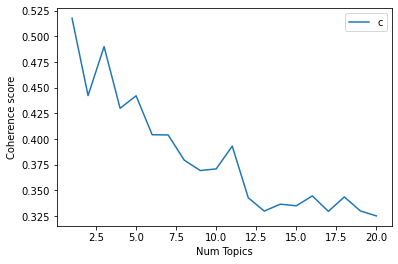

In [207]:
start=1
limit=21
step=1
model_list, coherence_values = compute_coherence_values(dictionary, corpus=corpus_tfidf, 
                                                        texts=text_list, start=start, limit=limit, step=step)
#show graphs
import matplotlib.pyplot as plt
x = range(start, limit, step)
plt.plot(x, coherence_values)
plt.xlabel("Num Topics")
plt.ylabel("Coherence score")
plt.legend(("coherence_values"), loc='best')
plt.show()

In [208]:
# Print the coherence scores
for m, cv in zip(x, coherence_values):
    print("Num Topics =", m, " has Coherence Value of", round(cv, 3))

Num Topics = 1  has Coherence Value of 0.518
Num Topics = 2  has Coherence Value of 0.442
Num Topics = 3  has Coherence Value of 0.49
Num Topics = 4  has Coherence Value of 0.43
Num Topics = 5  has Coherence Value of 0.442
Num Topics = 6  has Coherence Value of 0.404
Num Topics = 7  has Coherence Value of 0.404
Num Topics = 8  has Coherence Value of 0.38
Num Topics = 9  has Coherence Value of 0.369
Num Topics = 10  has Coherence Value of 0.371
Num Topics = 11  has Coherence Value of 0.393
Num Topics = 12  has Coherence Value of 0.343
Num Topics = 13  has Coherence Value of 0.33
Num Topics = 14  has Coherence Value of 0.337
Num Topics = 15  has Coherence Value of 0.335
Num Topics = 16  has Coherence Value of 0.345
Num Topics = 17  has Coherence Value of 0.33
Num Topics = 18  has Coherence Value of 0.344
Num Topics = 19  has Coherence Value of 0.33
Num Topics = 20  has Coherence Value of 0.325


In [209]:
model = LdaModel(corpus=corpus_tfidf, id2word=dictionary, num_topics=9) #num topic menyesuaikan hasil dari coherence value paling tinggi
for idx, topic in model.print_topics(-1):
    print('Topic: {} Word: {}'.format(idx, topic))
    # yg belum remove Yang, yg,trus lower text

Topic: 0 Word: 0.020*"plts_atap" + 0.017*"kurang_emisi" + 0.015*"komitmen" + 0.014*"pasok_listrik" + 0.013*"emisi" + 0.013*"plts" + 0.012*"tingkat" + 0.011*"pln" + 0.011*"karbon" + 0.010*"pasok"
Topic: 1 Word: 0.059*"pln_id" + 0.028*"pln" + 0.026*"id" + 0.023*"ramah_lingkung" + 0.014*"erick_thohir" + 0.011*"lingkung" + 0.009*"menteri_bumn" + 0.009*"pltu" + 0.009*"usaha" + 0.009*"ramah"
Topic: 2 Word: 0.042*"bangkit_listrik" + 0.024*"bangkit" + 0.019*"plta_poso" + 0.019*"listrik" + 0.015*"pln" + 0.014*"cepat" + 0.013*"bangun" + 0.012*"tenaga_surya" + 0.011*"tinggi_indonesia" + 0.010*"ruu"
Topic: 3 Word: 0.018*"net_zero" + 0.011*"renewable_energy" + 0.010*"tambah_kapasitas" + 0.009*"komisi_vii" + 0.009*"mantap" + 0.008*"net" + 0.008*"zero" + 0.008*"micho" + 0.008*"tinggal" + 0.008*"atap"
Topic: 4 Word: 0.061*"capai_target" + 0.029*"capai" + 0.027*"target" + 0.022*"kapasitas" + 0.015*"sumber_daya" + 0.014*"baur" + 0.014*"mobil_listrik" + 0.014*"rp_triliun" + 0.013*"mahal" + 0.013*"menteri

In [210]:
top_words_per_topic = []
for t in range(model.num_topics):
    top_words_per_topic.extend([(t, ) + x for x in model.show_topic(t, topn = 5)]) #ubah2 yg ini
df=pd.DataFrame(top_words_per_topic, columns=['Topic', 'Word', 'P']).to_csv("top_words_topic_20.csv")
#df = pd.DataFrame(top_words_per_topic, columns=['Topic', 'Word','P']).to_csv("top_words2_50_clean.csv")
print(df)


None


In [211]:
#ini dilakukan jika module belum tersedia
!pip install pyLDAvis
#!apt-get -qq install -y pyLDAvis

In [212]:
import pyLDAvis
import pyLDAvis.gensim_models;pyLDAvis.enable_notebook()
data = pyLDAvis.gensim_models.prepare(model, corpus_tfidf, dictionary)
print(data)
pyLDAvis.save_html(data, 'data/lda-gensim_clean_kualitatif1.html')

/Users/indralionardy/Personal/sara/tugas-akhir/venv/lib/python3.9/site-packages/past/builtins/misc.py:45: DeprecationWarning: the imp module is deprecated in favour of importlib; see the module's documentation for alternative uses
  from imp import reload
/Users/indralionardy/Personal/sara/tugas-akhir/venv/lib/python3.9/site-packages/past/builtins/misc.py:45: DeprecationWarning: the imp module is deprecated in favour of importlib; see the module's documentation for alternative uses
  from imp import reload
/Users/indralionardy/Personal/sara/tugas-akhir/venv/lib/python3.9/site-packages/past/builtins/misc.py:45: DeprecationWarning: the imp module is deprecated in favour of importlib; see the module's documentation for alternative uses
  from imp import reload
/Users/indralionardy/Personal/sara/tugas-akhir/venv/lib/python3.9/site-packages/past/builtins/misc.py:45: DeprecationWarning: the imp module is deprecated in favour of importlib; see the module's documentation for alternative uses
 

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
3     -0.173395  0.276410       1        1  16.145943
6      0.148507  0.081541       2        1  14.186761
1      0.133998  0.077541       3        1  13.725848
2      0.148800  0.053393       4        1  10.923028
0      0.079013 -0.018283       5        1   9.887821
5      0.045569 -0.107509       6        1   9.841508
7     -0.125922 -0.217996       7        1   8.893421
4      0.046206 -0.136268       8        1   8.680495
8     -0.302776 -0.008829       9        1   7.715175, topic_info=                 Term         Freq        Total Category  logprob  loglift
7140           pln_id  2197.000000  2197.000000  Default  30.0000  30.0000
357      menteri_esdm  1814.000000  1814.000000  Default  29.0000  29.0000
3092     capai_target  1445.000000  1445.000000  Default  28.0000  28.0000
783   bangkit_listrik  1547.000000  1547.000000  Default  27.00

In [218]:
print(data)

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
3     -0.173395  0.276410       1        1  16.145943
6      0.148507  0.081541       2        1  14.186761
1      0.133998  0.077541       3        1  13.725848
2      0.148800  0.053393       4        1  10.923028
0      0.079013 -0.018283       5        1   9.887821
5      0.045569 -0.107509       6        1   9.841508
7     -0.125922 -0.217996       7        1   8.893421
4      0.046206 -0.136268       8        1   8.680495
8     -0.302776 -0.008829       9        1   7.715175, topic_info=                 Term         Freq        Total Category  logprob  loglift
7140           pln_id  2197.000000  2197.000000  Default  30.0000  30.0000
357      menteri_esdm  1814.000000  1814.000000  Default  29.0000  29.0000
3092     capai_target  1445.000000  1445.000000  Default  28.0000  28.0000
783   bangkit_listrik  1547.000000  1547.000000  Default  27.00

In [213]:
import pyLDAvis.gensim_models as gensimvis
pyLDAvis.enable_notebook()
panel = gensimvis.prepare(model, corpus_tfidf, dictionary, mds='tsne')
panel

PreparedData(topic_coordinates=                x           y  topics  cluster       Freq
topic                                                    
3      111.092506 -133.722946       1        1  16.143656
6       34.946613  107.064590       2        1  14.188014
1      -28.088213 -159.949036       3        1  13.728172
2      147.698074   21.369604       4        1  10.921388
0      -97.501183  126.981384       5        1   9.886743
5       30.312096  -32.794945       6        1   9.843238
7     -155.443665 -118.494690       7        1   8.894723
4     -204.248108   22.596130       8        1   8.678772
8      -79.404678   -6.864717       9        1   7.715294, topic_info=                 Term         Freq        Total Category  logprob  loglift
7140           pln_id  2198.000000  2198.000000  Default  30.0000  30.0000
357      menteri_esdm  1815.000000  1815.000000  Default  29.0000  29.0000
3092     capai_target  1445.000000  1445.000000  Default  28.0000  28.0000
783   bangkit_listrik  1546.000000  1546.000000  Default  27.0000  27.0000
236      buka_peluang   928.000000   928.000000  Default  26.0000  26.0000
...               ...          ...          ...      ...      ...      ...
9534        cek_bawah   210.891457   212.478098   Topic9  -4.5993   2.5545
1104             dana   550.620395   562.329897   Topic9  -3.6396   2.5409
979              pltp   391.675161   407.345296   Topic9  -3.9802   2.5227
577             pulau   274.389455   290.107303   Topic9  -4.3361   2.5063
381            sektor   325.287335   585.369831   Topic9  -4.1659   1.9744

[430 rows x 6 columns], token_table=       Topic      Freq            Term
term                                  
99         1  0.024903             air
99         2  0.813492             air
99         3  0.016602             air
99         4  0.136965             air
1323       2  0.993979       airlangga
...      ...       ...             ...
2013       4  0.603263           wujud
6645       5  0.987409  wujud_komitmen
10521      8  0.992437          yantie
10522      8  0.996099      yantie_pln
2571       1  0.997797            zero

[624 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[4, 7, 2, 3, 1, 6, 8, 5, 9])